In [1]:

import sys
print(sys.path)

['/kaggle/working', '/kaggle/lib/kagglegym', '/kaggle/lib', '/opt/conda/lib/python310.zip', '/opt/conda/lib/python3.10', '/opt/conda/lib/python3.10/lib-dynload', '', '/root/.local/lib/python3.10/site-packages', '/opt/conda/lib/python3.10/site-packages', '/root/src/BigQuery_Helper']


In [2]:
import torch
from torch import optim
import numpy as np
import matplotlib.pyplot as plt
import torch.optim
import os
import pandas as pd
import torchvision.io
from torchvision.io import read_image
from torch.utils.data import DataLoader
import torch.nn as nn
from torch.nn import functional as F



In [3]:
NUM_CHANNELS = 3
HIDDEN_SIZE = 768
HIDDEN_DROPOUT_PROB = 0.5
BATCH_SIZE = 16
ATTENTION_HEADS = 12
PATCH_DIM = 14

In [4]:

import math

class attentionHead(nn.Module):
  def __init__(self):
    super().__init__()
    self.feats = HIDDEN_SIZE #TODO abstract this
    self.firstlin = nn.Linear(self.feats,self.feats*3)
    self.dropout = nn.Dropout(.5)

  def forward(self,x, mode):
    """
    x :
    """
    batch_size = x.shape[0]
    x = self.firstlin(x) # (B, #patches, hidden_size*3)
    x = torch.reshape(x,(batch_size,ATTENTION_HEADS,3,PATCH_DIM*PATCH_DIM,HIDDEN_SIZE//ATTENTION_HEADS)) 
    Q,K,V = torch.unbind(x,2)
    QK = torch.matmul(Q,torch.transpose(K,3,2))
    #QK = QK / math.sqrt(HIDDEN_SIZE//ATTENTION_HEADS)
    #QK = F.softmax(QK,dim = -1) #May need to swap dimension of softmax
    out = torch.matmul(QK,V)
    out = torch.transpose(out,1,2)
    out = torch.flatten(out, start_dim = 2)
    out = self.dropout(out)
    
    return out


In [5]:
class PatchEmbeddings(nn.Module):
  """
  image patches -> embeddings
  """
  def __init__(self):
    super().__init__()
    self.img_size = (224,224)
    self.patch_size = (16,16)

    self.patch_embed = nn.Conv2d(NUM_CHANNELS, HIDDEN_SIZE, self.patch_size, stride=self.patch_size) # (B,C,H,W)

  def forward(self,x):
    x = self.patch_embed(x.float()).flatten(2) # output of (B, new channel dimension, #patches)
    x= x.transpose(1,2) # (B, #patches, new channel dimension) ??
    return x


  #print(input.shape)

  #print(input.shape)
  #print(output)
  #embed = patch_embedding(i)
  #print(embed)

class Embeddings(nn.Module):
  """
  creates the embeddings vectors for the patches by combining patch embeddings with positional embeddings
  """

  def __init__(self):
    super().__init__()
    self.patch_embeddings = PatchEmbeddings()

    # TODO add CLS token

    num_patches = (self.patch_embeddings.img_size[0] // self.patch_embeddings.patch_size[0]) ** 2

    # creating positional embedding, this is a learned parameter
    # num_patches -> num_patches + 1 for adding CLS
    self.position_embed =  nn.Parameter(torch.randn(1, num_patches, HIDDEN_SIZE)) # this is without cls token for now
    self.dropout = nn.Dropout(HIDDEN_DROPOUT_PROB)

  def forward(self, patches):
    # create embedding for this patch
    embeddings = self.patch_embeddings(patches)
    #print("pos embeddings")
    #print(embeddings.shape)
    batch_size = embeddings.size()[0]

    # TODO Add CLS tokens

    # add positional embedding to patch embedding
    embeddings = embeddings + self.position_embed
    embeddings = self.dropout(embeddings)
    return embeddings



In [6]:

class feedForward(nn.Module):
  def __init__(self):
    super().__init__()
    self.indim = HIDDEN_SIZE
    self.outdim = HIDDEN_SIZE
    self.lay1 = nn.Linear(self.indim,self.outdim)
    self.lay2 = nn.Linear(self.outdim,self.indim)
    self.relu = nn.ReLU()
    self.dropout = nn.Dropout(.5)
  def forward(self,x):
    return self.dropout(self.lay2(self.relu(self.lay1(x))))


In [7]:


class DecoderHeadSimple(nn.Module):
    """
    Heatmap based decoder head for the human pose estimation task.
    """
    def __init__(self, in_channels, out_channels = 14, num_deconv_layers=2,
                 num_deconv_filters=(224, 224),
                 num_deconv_kernels=(2, 2)): # ihis leads to an upscaling by a factor of 2 for each deconv block
        
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        
        self.deconv_layers = self._make_deconv_layer(
            num_deconv_layers,
            num_deconv_filters,
            num_deconv_kernels
        )

        self.last_conv = nn.Conv2d(
            in_channels=num_deconv_filters[-1],
            out_channels=self.out_channels,
            kernel_size=1,
            stride=1,
            padding=0
        )


    def forward(self, x):
        x =torch.swapaxes(x,1, 2) # -> (batches, channels, #patches)
        x = x.view((-1, HIDDEN_SIZE, PATCH_DIM, PATCH_DIM)) # ->( batches, channels, height, width)
        

        x = self.deconv_layers(x) 
        x = self.last_conv(x)
        return x

    def  _make_deconv_layer(self, num_layers, num_filters, num_kernels):
        """
        Create the deconvolution layers.
        """

        assert num_layers == len(num_filters) == len(num_kernels)

        layers = []
        
        for i in range(num_layers):
            kernel, padding, output_padding = self._get_deconv_cfg(num_kernels[i]) # selects for kernel sizes of 4,3,2 for the deconvolution layers
            planes = num_filters[i]
            layers.append(
                nn.ConvTranspose2d(
                    in_channels=self.in_channels,
                    out_channels=planes,
                    kernel_size=kernel,
                    stride=2, 
                    padding=padding,
                    output_padding=output_padding,
                    bias=False
                )
            )
            layers.append(nn.BatchNorm2d(planes))
            layers.append(nn.ReLU(inplace=True))
            self.in_channels = planes # update the number of input channels for the next deconvolution layer
        
        return nn.Sequential(*layers)
    
    @staticmethod
    def _get_deconv_cfg(deconv_kernel):
        """
        setting kernel, padding and output_padding for deconvolution
        """
        if deconv_kernel == 4:
            padding = 1
            output_padding = 0
        elif deconv_kernel == 3:
            padding = 1
            output_padding = 1
        elif deconv_kernel == 2:
            padding = 0
            output_padding = 0
        else:
            raise ValueError("Incompatible deconvolution kernel size.")

        return deconv_kernel, padding, output_padding


In [8]:

class JointsMSELoss(nn.Module):
  def __init__(self):
    super(JointsMSELoss, self).__init__()
    self.mse = nn.MSELoss(size_average=True)
    
  def forward(self, output, target):
    batch_size = output.shape[0]
    num_joints = output.shape[1] # get #joints for this image of (batch_size, num_joints, height, width)
    heatmaps_pred = output.reshape((batch_size, num_joints, -1)).split(1, 1) # reshape heatmap predictions
    heatmaps_target = target.reshape((batch_size, num_joints, -1)).split(1, 1) # reshape target values

    loss = 0

    for joint_idx in range(num_joints):
      heatmap_pred = heatmaps_pred[joint_idx].squeeze()
      heatmap_target = heatmaps_target[joint_idx].squeeze()

      loss += 1 * self.mse(heatmap_pred, heatmap_target)
    
    # average loss per joint because number of joints in images are variable
    return loss / num_joints 


In [9]:


class TransformerPoseModel(nn.Module):
    """
    Transformer based pose estimation model.
    """
    def __init__(self, num_blocks, num_keypoints=14, num_deconv_layers=2,
                 num_deconv_filters=(224, 224),
                 num_deconv_kernels=(2, 2)):
        super().__init__()
        self.num_keypoints = num_keypoints
        self.num_deconv_layers = num_deconv_layers
        self.num_deconv_filters = num_deconv_filters
        self.num_deconv_kernels = num_deconv_kernels
        self.embeds = Embeddings()
        self.blocks = nn.ModuleList([])

        for _ in range(num_blocks):
            block = TransformerBlock()
            self.blocks.append(block)

        self.head = DecoderHeadSimple(
            in_channels= HIDDEN_SIZE, # gotta check this info I think its the size of the patch 
            out_channels=num_keypoints,
            num_deconv_layers=num_deconv_layers,
            num_deconv_filters=num_deconv_filters,
            num_deconv_kernels=num_deconv_kernels
        )
    
    def forward(self, x, mode):

        x = self.embeds(x) # pass to the patch embedding layer

        #print("embedding shape")
        #print(x.shape)

        for blocks in self.blocks: # pass through the transformer blocks
            x = blocks(x, mode)

        #print("postT_trans shape")
        #print(x.shape)
        x = self.head(x) # pass through the decoder head

        return x


In [10]:


class TransformerBlock(nn.Module):
  """
  Singular Transformer block.
  """
  def __init__(self):
    super().__init__()
    self.img_size = (224,224)
    self.patch_size = (16,16)
    self.embedsize = HIDDEN_SIZE
    self.attention = attentionHead()
    self.ffn = feedForward()
    self.norm1 = nn.LayerNorm((PATCH_DIM*PATCH_DIM,HIDDEN_SIZE))
    self.norm2 = nn.LayerNorm((PATCH_DIM*PATCH_DIM,HIDDEN_SIZE))
    

  def forward(self,x, mode):
    #print("beginning trasnformer block")
    #print(x.shape)
    tensor1 = self.norm1(x)
    tensor1 = self.attention(tensor1, mode)
    tensor1 = tensor1 + x
    tensor2 = self.norm2(tensor1)
    tensor2 = self.ffn(tensor2)
    tensor2 = tensor2 + tensor1

    return tensor2


In [11]:
import datetime
import torch

def train(epochs, model, loss_func, data_loader, device, verbose=True, save_name=None, save_freq=None):
    num_batches = len(data_loader)
    
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    for epoch in range(epochs):
        start_epoch = datetime.datetime.now()
        total_loss = 0
        count = 0
        load_tensor_total = datetime.timedelta()
        model_computation_total = datetime.timedelta()
        calc_loss_total = datetime.timedelta()
        loss_backward_total = datetime.timedelta()
        optimizer_time_total = datetime.timedelta()
        for (imgs, labels, _) in data_loader:
            load_tensors_start = datetime.datetime.now()
            imgs = imgs.to(device)
            labels = labels.float()
            labels = labels.to(device)
            load_tensor_total += datetime.datetime.now() - load_tensors_start

            optimizer.zero_grad()

            computation_start = datetime.datetime.now()
            output = model(imgs, 'train') # -> (5, H/4, W/4, #joints) 
            computation_time_total = datetime.datetime.now() - computation_start

            calc_loss_start = datetime.datetime.now()
            loss = loss_func(output, labels.float())
            calc_loss_total += datetime.datetime.now() - calc_loss_start
            
            loss_backward_start = datetime.datetime.now()
            loss.backward()
            loss_backward_total += datetime.datetime.now() - loss_backward_start

            optimizer_start_time = datetime.datetime.now()
            optimizer.step()
            optimizer_time_total = datetime.datetime.now() - optimizer_start_time
            total_loss += loss

            #break
            
        if verbose:
            print("epoch:", epoch, "loss: ", total_loss)
            elapsed_epoch = datetime.datetime.now() - start_epoch
            print(f"epoch {epoch} trained in: {elapsed_epoch}")
            print(f"AVG time per batch {elapsed_epoch / num_batches}")
            print(f"AVG tensor load time: {load_tensor_total / num_batches}")
            print(f"AVG prediction time: {computation_time_total / num_batches}")
            print(f"AVG loss calc time: {calc_loss_total / num_batches}")
            print(f"AVG loss backward time: {loss_backward_total / num_batches}")
            print(f"AVG optimizer step time: {optimizer_time_total / num_batches}")
            # displayHeatmap(output)
            # test_plot()
        print(epoch)
        print((epoch + 1) % save_freq == 0)
        if save_name is not None and save_freq is not None and (epoch + 1) % save_freq == 0:
            torch.save(model.state_dict(), "checkpoint"+str(epoch)+".pth")
    if save_name is not None:
        torch.save(model.state_dict(), "checkpoint"+str(epoch)+".pth")


In [12]:
import datetime

def validate(model, optimizer, loss_func, data_loader, device):
  start_time = datetime.timedelta()
  total_loss = 0
  for batch_idx, (imgs, labels, _) in enumerate(data_loader):
    imgs = imgs.to(device)
    labels = labels.float()
    labels = labels.to(device)

    optimizer.zero_grad()

    output = model(imgs, 'val') # -> (5, H/4, W/4, #joints) 

    loss = loss_func(output, labels.float())
    
    loss.backward()

    total_loss += loss

  elapsed_time = datetime.datetime.now() - start_time

  print(f"finished validation in {elapsed_time}")
  print(f"loss: {total_loss}")


In [13]:
import matplotlib.pyplot as plt
import torch
import torchvision.io


def displayHeatmaps(heatmaps):
  for i in range(14):
    plt.imshow(heatmaps[0][i].detach().cpu().numpy())
    plt.show()

def test_plot(model, device, path, true_coor=None):
  im = torchvision.io.read_image(path)
  im = torch.unsqueeze(im, 0)
  im = im.to(device)

  joints = model(im, False)
  # displayHeatmap(joints)
  joints = joints.squeeze()
  im = im.squeeze()
  x = []
  y = []
  for joint in joints:
    # print(f"max: {(joint==torch.max(joint)).nonzero()}")
    coor = (joint==torch.max(joint)).nonzero()
    if torch.max(joint) > .5:
      x.append(int(coor[0][0] * 4))
      y.append(int(coor[0][1] * 4))
  im = im.cpu()
  plot_with_joints_r(im, x, y)

def plot_many(model, device, data_loader, showTrue=False):
  for batch_idx, (imgs, labels, path) in enumerate(data_loader):
    path = path[0]
    if batch_idx == 50:
      break
    im = torchvision.io.read_image(path)
    im = torch.unsqueeze(im, 0)
    im = im.to(device)

    joints = model(im, 'pred')
    joints = joints.squeeze()
    im = im.squeeze()
    x = []
    y = []
    tx = []
    ty = []
    for joint in joints:
      # print(f"max: {(joint==torch.max(joint)).nonzero()}")
      coor = (joint==torch.max(joint)).nonzero()
      x.append(int(coor[0][0] * 4))
      y.append(int(coor[0][1] * 4))

    if showTrue:
      labels = labels[0]
      for true_joint in labels:
        if torch.max(true_joint) > .5:
          t_coor = (true_joint==torch.max(true_joint)).nonzero()
          tx.append(int(t_coor[0][0] * 4))
          ty.append(int(t_coor[0][1] * 4))

    im = im.cpu()
    plot_with_joints_r(im, x, y, tx, ty)
  
def plot_all_heatmaps(model, device, data_loader):
  imgs, labels, path = next(iter(data_loader))
  imgs = imgs.to(device)
  preds = model(imgs, 'pred')
  displayHeatmaps(preds)

In [14]:
import os 
import PIL 
from PIL import Image


def get_image_sizes(folder_path):
    """
    retreive the sizes of the original images
    """
    sizes = []
    image_files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    # Iterate over files in the folder
    for filename in image_files:

      file_path = os.path.join(folder_path, filename)

      # Open the image using PIL
      with Image.open(file_path) as img:
          # Get the size of the image (width, height)
          img_size = img.size
          sizes.append(img_size)

    return sizes

def resize(dirs, path):
    """
    Searches the the directory located at path dirs and resizes iamges in this path
    """
    for item in dirs:
        if os.path.isfile(path+item):
            img = Image.open(path+item)
            print(img.size)
            f, e = os.path.splitext(path+item)
            img = img.resize((224,224), Image.ANTIALIAS)
            img.save(f + '.jpg')
            print(img.size)


def get_list_of_image_names(path):
    """
    Returns the names of all files within a directory in alphabetical order.  This
    should only be used on folders with only images in them
    """
    # path = "/home/mxerri/JointPoseEstimation/Data/lsp/images/"
    dir_list = sorted(os.listdir(path))
    return dir_list




In [15]:
import numpy as np
from scipy.ndimage.filters import gaussian_filter
from scipy.ndimage import zoom 

def generate_gaussian_heatmap(list_of_joint_list, resolution_size, sigma=1.5):
    """
    Generate a Gaussian heatmap centered at a given coordinate.

    Parameters:
    - list_of_joint_lists: 3D tensor of (batch_size, # joints, 3).
    - resolution_size: Tuple (height, width) representing the resolution of the heatmap.
    - sigma: Standard deviation of the Gaussian distribution.

    Returns:
    - gaussian_heatmap: NumPy array representing the generated Gaussian heatmap.
    """
    assert list_of_joint_list.shape[1] == 14
    assert list_of_joint_list.shape[2] == 3
    assert len(resolution_size) == 2

    output = np.zeros((len(list_of_joint_list), 14, resolution_size[0], resolution_size[1]))
    for i in range(len(list_of_joint_list)):
        heatmaps_for_n_joints = np.zeros((14, resolution_size[0], resolution_size[1]))
        for j in range(14):
            
            if list_of_joint_list[i][j][2] == 1: # joint is visible 
                
                coordinate = list_of_joint_list[i][j]
                gaussian_heatmap = np.zeros(resolution_size)
                # Create meshgrids for the entire resolution_size
                y, x = np.meshgrid(np.arange(resolution_size[0]), np.arange(resolution_size[1]))

                # Use NumPy broadcasting for vectorized operations
                gaussian_heatmap = np.exp(-((x - coordinate[0])**2 + (y - coordinate[1])**2) / (2.0 * sigma**2))

                # Normalize the heatmap to have values between 0 and 1
                gaussian_heatmap /= np.max(gaussian_heatmap)

                heatmaps_for_n_joints[j] = gaussian_heatmap 
            else:
                heatmaps_for_n_joints[j] = np.ones(resolution_size) / 10.0 # set to low confidence value for non-visible joints
        output[i] = heatmaps_for_n_joints
        
    return output

def generate_single_image_gaussian(joint_list, resolution_size, sigma=1.5):
    """
    Generate a Gaussian heatmap centered at a given coordinate.

    Parameters:
    - list_of_joint_lists: 2D tensor of (# joints, 3).
    - resolution_size: Tuple (height, width) representing the resolution of the heatmap.
    - sigma: Standard deviation of the Gaussian distribution.

    Returns:
    - gaussian_heatmap: NumPy array representing the generated Gaussian heatmap.
    """
    heatmaps_for_n_joints = np.zeros((14, resolution_size[0], resolution_size[1]))
    for j in range(14):
        
        if joint_list[j][2] == 1: # joint is visible 
            
            coordinate = joint_list[j]
            gaussian_heatmap = np.zeros(resolution_size)
            # Create meshgrids for the entire resolution_size
            y, x = np.meshgrid(np.arange(resolution_size[0]), np.arange(resolution_size[1]))

            # Use NumPy broadcasting for vectorized operations
            gaussian_heatmap = np.exp(-((x - coordinate[0])**2 + (y - coordinate[1])**2) / (2.0 * sigma**2))

            # Normalize the heatmap to have values between 0 and 1
            gaussian_heatmap /= np.max(gaussian_heatmap)

            heatmaps_for_n_joints[j] = gaussian_heatmap 
        else:
            heatmaps_for_n_joints[j] = np.ones(resolution_size) / 10.0 # set to low confidence value for non-visible joints
    return heatmaps_for_n_joints



def upsample_heatmap(heatmaps, target_resolution):
    """
    Upsample a heatmap to a target resolution using bilinear interpolation.

    Parameters:
    - heatmap: 4D NumPy array representing batches of the 14 heatmaps per image the lower-resolution heatmap.
    - target_resolution: Tuple (height, width) representing the target resolution.

    Returns:
    - upsampled_heatmap: array of 2D NumPy array representing the upsampled heatmap.
    """
    # Function does not produce smooth gaussian yet 
    output = np.zeros((len(heatmaps), 14, target_resolution[0], target_resolution[1]))
    for b in range(len(heatmaps)):
        for j in range(len(heatmaps[b])):
            # Get the current resolution of the heatmap
            current_resolution = heatmaps[b][j].shape

            # Calculate the scaling factors for height and width
            scale_factor_row = target_resolution[0] / current_resolution[0]
            scale_factor_col = target_resolution[1] / current_resolution[1]

            # Use scipy's zoom function for bilinear interpolation
            upsampled_heatmap = zoom(heatmaps[b][j], (scale_factor_row, scale_factor_col), order=1)
            output[b][j] = upsampled_heatmap
    return output


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [16]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


def batched_resize_joint(joints, resize_dim, original_dim):
    """
    returns the new batched joint coordinate in the batch of images
    """
    vfunc = np.vectorize(resize_single_joint)
    final = vfunc(joints, resize_dim, original_dim)
    return final

def resize_single_joint(joints, resize_dim, original_dim):
    """
    returns the new joint coordinate in the reshaped image
    """
    new = np.zeros((14,3))
    for idx, point in enumerate(joints):
        x1 = int((point[0] * (resize_dim[0] / original_dim[0])))
        y1 = int((point[1] * (resize_dim[1] / original_dim[1])))
        new[idx,:] = [x1,y1,point[2]] # append resized coordinate
    return new

# plotting functions:
def plot_with_joints(img, joints):
    """
    Plots an image overlayed with the joints
    """

    img = np.swapaxes(img,0,2)
    img = np.swapaxes(img,0,1)
    plt.scatter(joints[:,0],joints[:,1])
    plt.imshow(img)
    plt.show()

def plot_with_joints_r(img, x, y, tx=[], ty=[]):
    img = np.swapaxes(img,0,2)
    img = np.swapaxes(img,0,1)
    plt.scatter(x, y, c=mcolors.CSS4_COLORS['deepskyblue'])
    if len(tx) != 0:
        plt.scatter(tx, ty, c=mcolors.CSS4_COLORS['chartreuse'])
    plt.imshow(img)
    plt.show()


In [17]:
class CustomDataset():
  """
  Custom Pose Dataset

  Parameters:
    - image_labels: list of joint annotations of shape (n,14,3)
    - image_name: list of image names corresponding to the joint annotations at the same index 
    - img_dir: image directory to the location storing images
  """
  def __init__(self, image_labels, image_names, img_dir, sigma):
    self.image_labels = image_labels
    self.image_names = image_names
    self.img_dir = img_dir
    self.sigma = sigma
    # can add transforms if we need/want

  def __len__(self):
    return (self.image_labels.shape[0])

  def __getitem__(self, idx):
    # idx: int -> index of image sample
    # image: torch.Tensor -> pytorch tensor representing image specified
    # label: list[dict] -> each dict contains x and y coordinate, joint id, and whether the joint is visible

    
    # img_path = self.img_dir + "resized_im" + '0'*(5-len(str(idx+1))) + str(idx + 1) + ".jpg"
    img_path = self.img_dir + self.image_names[idx]
    image = read_image(img_path)

    # generate heatmap label 
    label = generate_single_image_gaussian(self.image_labels[idx], (56,56), self.sigma)

    return image, label, img_path


In [18]:
if torch.backends.mps.is_available():
  device = torch.device('mps')
elif torch.cuda.is_available():
  device = torch.device('cuda')
else:
  device = torch.device('cpu')

In [19]:
# dataset loading
# annot = np.load('/home/mxerri/JointPoseEstimation/Data/lsp/leeds_sports_extended.npy')
annot = np.load('/kaggle/input/leedssportsprocessed/leeds_sports_extended.npy')
annot_s = np.swapaxes(annot, 0,2)
annot_s = np.swapaxes(annot_s,1,2)

# retrieve image sizes
# image_sizes = get_image_sizes('/home/mxerri/JointPoseEstimation/Data/lsp/images/')
image_sizes = get_image_sizes('/kaggle/input/lspext/LSPEXT/images')
# image_sizes_resized = get_image_sizes('/home/mxerri/JointPoseEstimation/Data/lsp/images224/')
image_sizes_resized = get_image_sizes('/kaggle/input/lspext/LSPEXT/images224')
annot_resize = np.zeros_like(annot_s)

# resize annotations
for i in range(10000):
    annot_resize[i] = resize_single_joint(annot_s[i],image_sizes_resized[i],image_sizes[i] ) 
    # make annortations into 56 x 56 for loss function 
    annot_resize[i] = resize_single_joint(annot_resize[i],(56,56),(224,224))

In [20]:
# create mpii dataset
mpii_annot_s = np.load('/kaggle/input/mpii-annotations/mpii_annots.npy') ## Change this



mpii_image_sizes = np.load('/kaggle/input/mpiiimage-sizes/mpii_og_sizes.npy')
mpii_image_sizes_resized = get_image_sizes('/kaggle/input/mpii-resized-images/images224')

mpii_annot_resize = np.zeros_like(mpii_annot_s)
for i in range(mpii_annot_resize.shape[0]):
    mpii_annot_resize[i] = resize_single_joint(mpii_annot_s[i],(224,224),mpii_image_sizes[i] ) 
    # make annortations into 56 x 56 for loss function 
    mpii_annot_resize[i] = resize_single_joint(mpii_annot_resize[i],(56,56),(224,224))

In [21]:
og_annot = np.load('/kaggle/input/lspogg/lsp_og/leeds_sports_og.npy')
print(og_annot.shape)
og_annot_s = np.swapaxes(og_annot, 0,2)
# og_annot_s = np.swapaxes(og_annot_s,1,2)

# retrieve image sizes
# image_sizes = get_image_sizes('/home/mxerri/JointPoseEstimation/Data/lsp/images/')
og_image_sizes = get_image_sizes('/kaggle/input/lspogimages/images/')
# image_sizes_resized = get_image_sizes('/home/mxerri/JointPoseEstimation/Data/lsp/images224/')
og_image_sizes_resized = get_image_sizes('/kaggle/input/lspogg/lsp_og/images224/')
og_annot_resize = np.zeros_like(og_annot_s)

# resize annotations
for i in range(2000):
    og_annot_resize[i] = resize_single_joint(og_annot_s[i],og_image_sizes_resized[i],og_image_sizes[i] ) 
    # make annortations into 56 x 56 for loss function 
    og_annot_resize[i] = resize_single_joint(og_annot_resize[i],(56,56),(224,224))

(3, 14, 2000)


In [22]:
# create lsp dataset
lsp_image_name_list = get_list_of_image_names('/kaggle/input/lspext/LSPEXT/images224')
lsp_dataset = CustomDataset(annot_resize, lsp_image_name_list,'/kaggle/input/lspext/LSPEXT/images224/',3)
print(annot_resize.shape)

# create mpii dataset
mpii_image_name_list = get_list_of_image_names('/kaggle/input/mpii-resized-images/images224')
mpii_dataset = CustomDataset(mpii_annot_resize, mpii_image_name_list,'/kaggle/input/mpii-resized-images/images224/', 3)
print(mpii_annot_resize.shape)

og_lsp_image_name_list = get_list_of_image_names('/kaggle/input/lspogg/lsp_og/images224/')
og_lsp_dataset = CustomDataset(og_annot_resize, og_lsp_image_name_list, '/kaggle/input/lspogg/lsp_og/images224/',3)

# concat datasets into one large training dataset
# allows us to shuffle the images from mpii and lsp together
train_dataset = torch.utils.data.ConcatDataset([lsp_dataset, mpii_dataset])
data_loader = DataLoader(train_dataset, batch_size=16, shuffle = True)
val_loader = DataLoader(og_lsp_dataset, batch_size=16, shuffle=False)

(10000, 14, 3)
(11749, 14, 3)


(10, 14, 56, 56)
(56, 56)
(18, 40)
[18. 40.  1.]


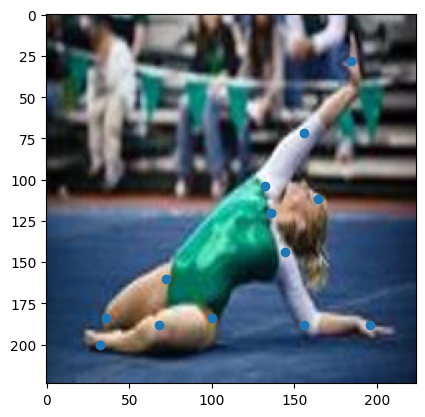

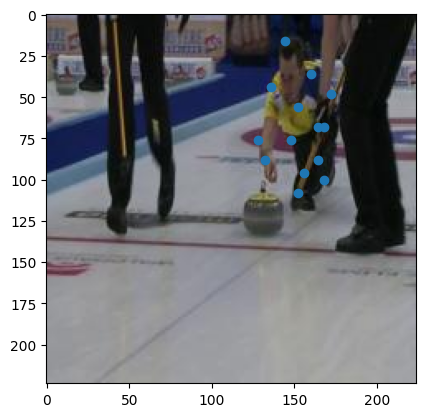

060111501.jpg


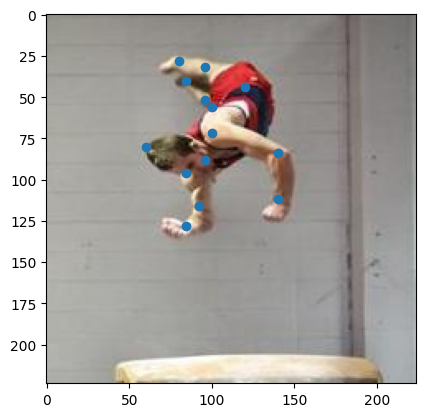

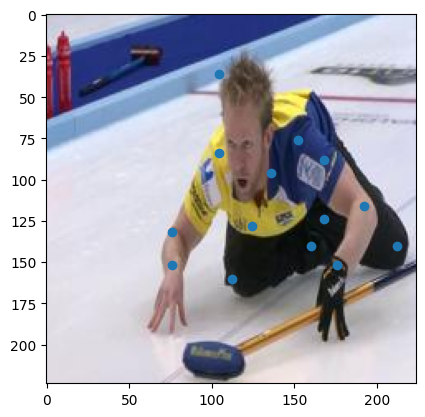

002058449.jpg


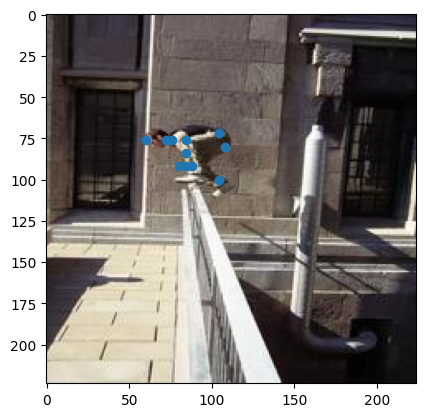

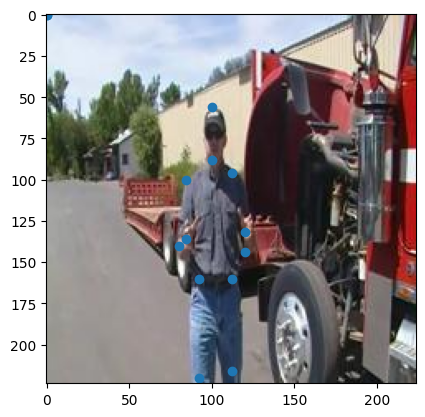

029122914.jpg


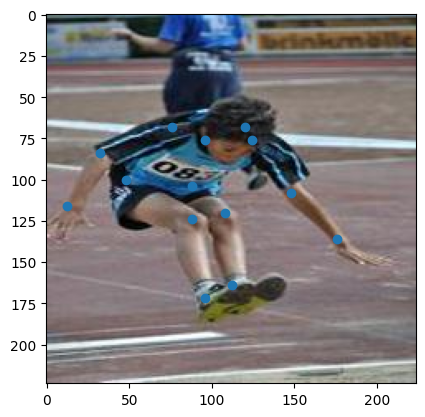

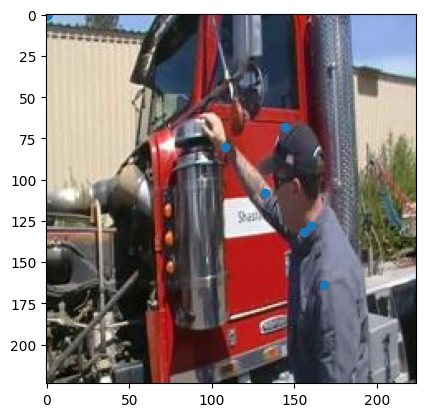

061185289.jpg


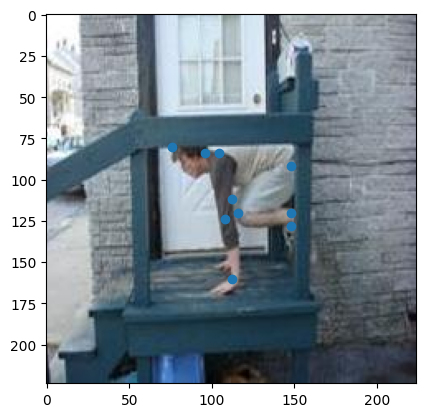

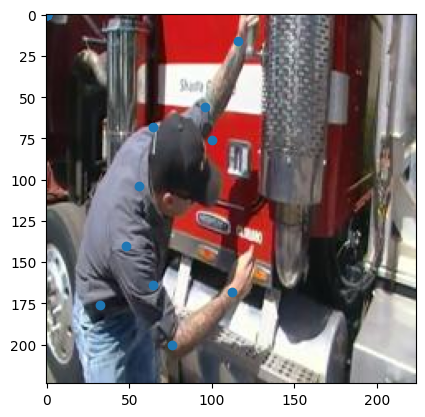

013949386.jpg


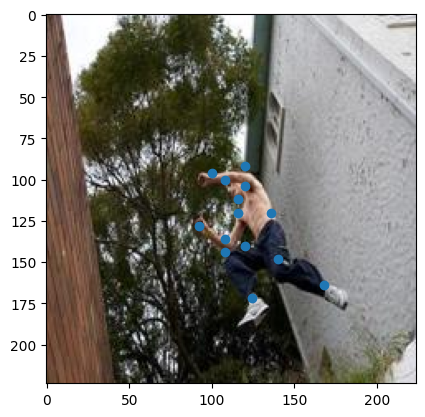

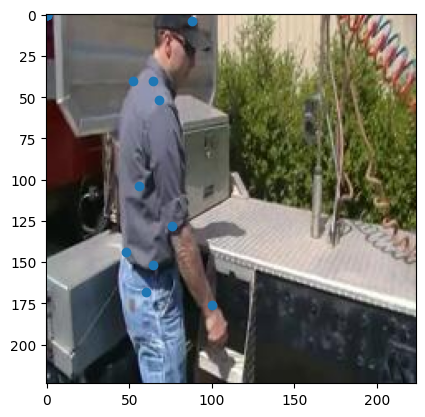

029214465.jpg


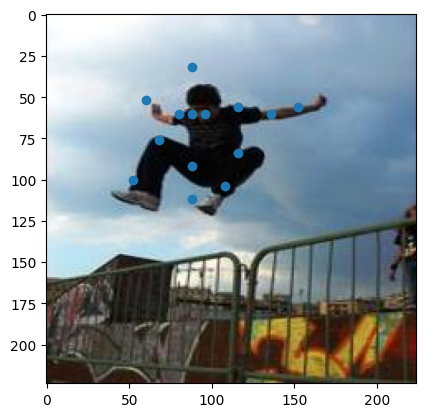

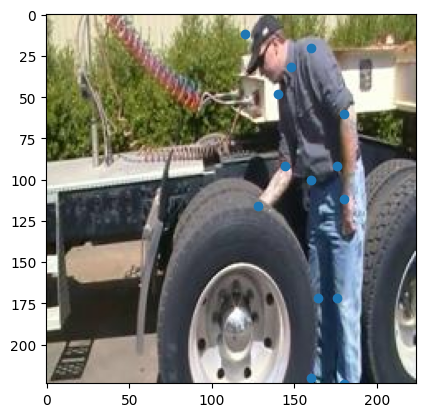

036636184.jpg


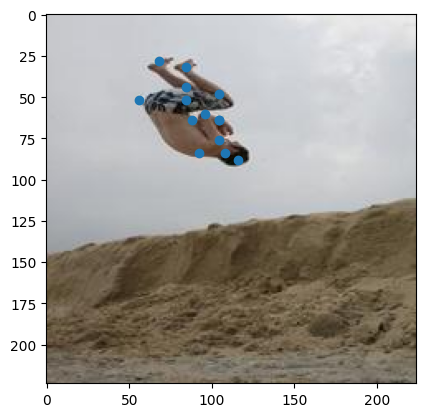

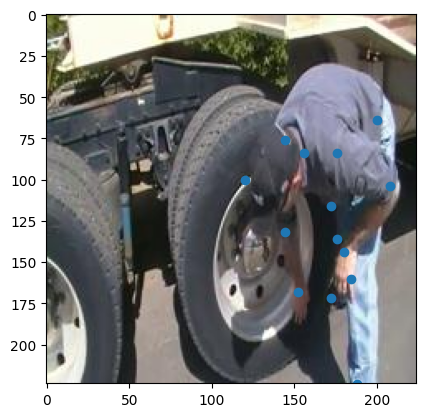

045606998.jpg


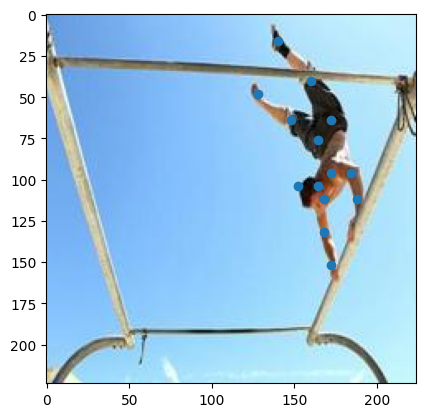

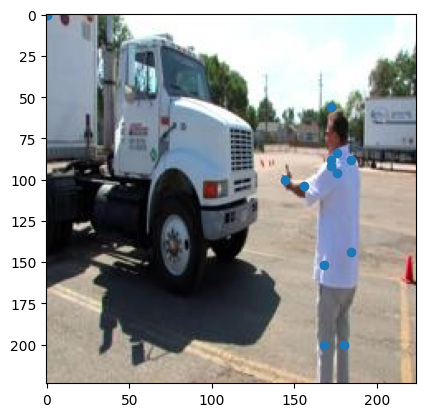

051423444.jpg


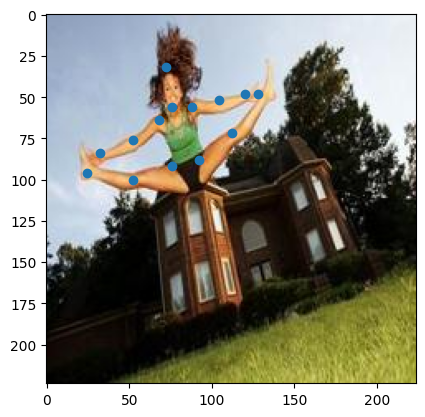

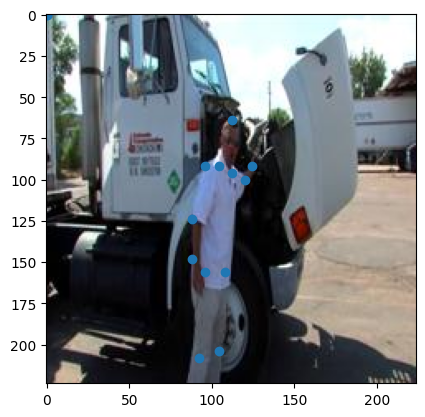

059241457.jpg


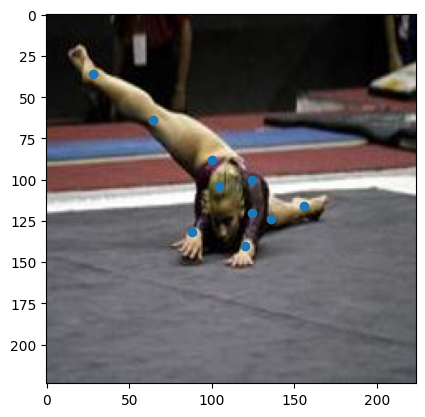

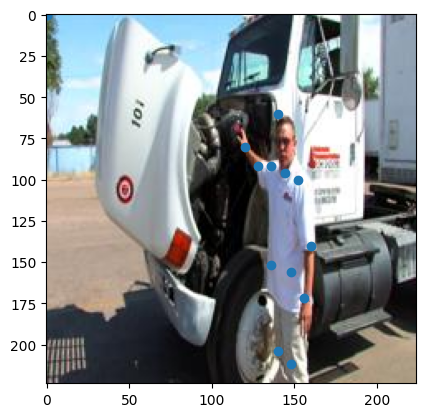

004645041.jpg


In [23]:
# convert to joint heatmaps from coordiantes: 
heatmaps = generate_gaussian_heatmap(annot_resize[0:10],(56,56),3)
print(heatmaps.shape)
plt.imshow(heatmaps[0][2])
print(heatmaps[0][2].shape)
z = np.unravel_index(heatmaps[0,2,:,:].argmax(), heatmaps[0,2,:,:].shape)
print(z)
print(annot_resize[0,2,:])



dir_list = get_list_of_image_names('/kaggle/input/lspext/LSPEXT/images224/')

mpii_dir_list = np.load('/kaggle/input/mpii-annotations/mpii_image_names.npy')

for i in range(10000):
   
    plot_with_joints(read_image("/kaggle/input/lspext/LSPEXT/images224/" + dir_list[i]),annot_resize[i]*4)
    plot_with_joints(read_image("/kaggle/input/mpii-resized-images/images224/" + "re_" + mpii_dir_list[i]),mpii_annot_resize[i]*4)
    print(mpii_dir_list[i])
    
    if i ==10:
        break


In [24]:
model = TransformerPoseModel(2)
optimizer = optim.Adam(model.parameters(), lr=0.001)


loss_func = JointsMSELoss()
model.to(device)


train(
  epochs=200,
  model=model,
  loss_func=loss_func,
  data_loader=data_loader,
  device=device,
  save_name='test',
  save_freq=5
  )

#validate(
#  model=model,
#  optimizer=optimizer,
#  loss_func=loss_func,
#  data_loader=data_loader, # TODO: Update this with Original LSP dataloader
#  device=device
#)

/opt/conda/lib/python3.10/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


epoch: 0 loss:  tensor(10.8839, device='cuda:0', grad_fn=<AddBackward0>)
epoch 0 trained in: 0:01:43.317452
AVG time per batch 0:00:00.075969
AVG tensor load time: 0:00:00.014623
AVG prediction time: 0:00:00.000005
AVG loss calc time: 0:00:00.001398
AVG loss backward time: 0:00:00.003961
AVG optimizer step time: 0:00:00.000001
0
False
epoch: 1 loss:  tensor(9.9021, device='cuda:0', grad_fn=<AddBackward0>)
epoch 1 trained in: 0:01:37.366305
AVG time per batch 0:00:00.071593
AVG tensor load time: 0:00:00.016499
AVG prediction time: 0:00:00.000002
AVG loss calc time: 0:00:00.001382
AVG loss backward time: 0:00:00.003281
AVG optimizer step time: 0:00:00.000001
1
False
epoch: 2 loss:  tensor(9.8322, device='cuda:0', grad_fn=<AddBackward0>)
epoch 2 trained in: 0:01:37.366777
AVG time per batch 0:00:00.071593
AVG tensor load time: 0:00:00.016589
AVG prediction time: 0:00:00.000002
AVG loss calc time: 0:00:00.001387
AVG loss backward time: 0:00:00.003217
AVG optimizer step time: 0:00:00.000001

finished validation in 2023-12-13 12:41:55.518735
loss: 0.9946281313896179
None


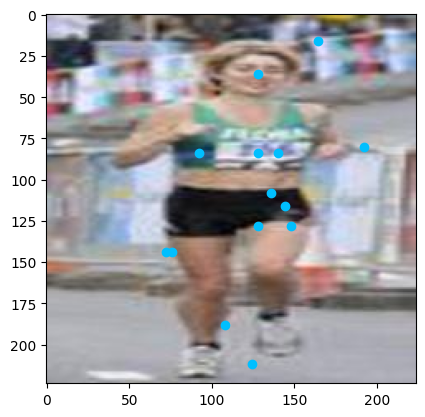

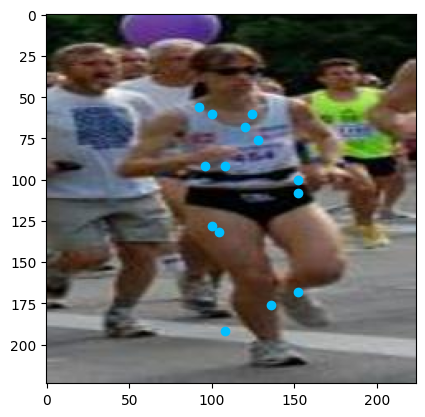

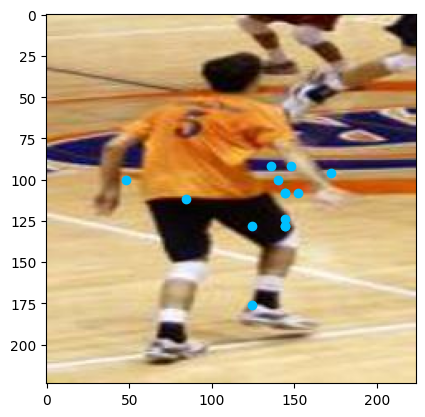

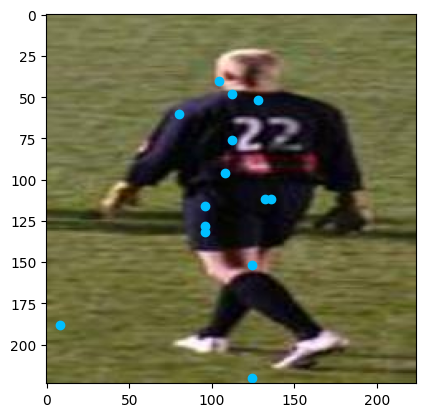

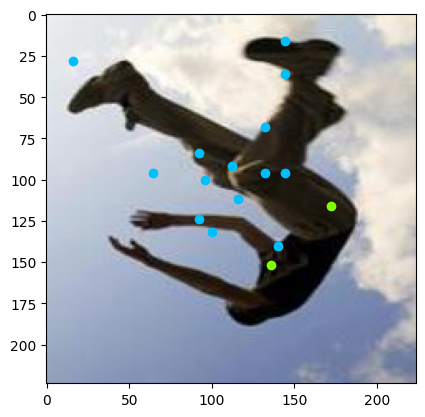

...

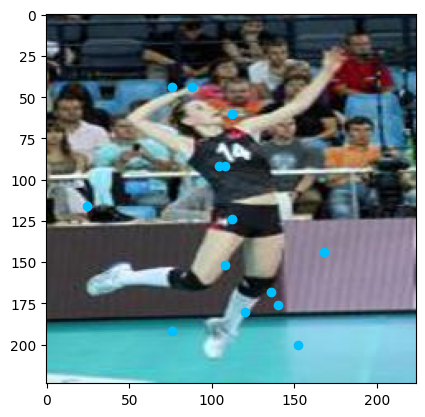

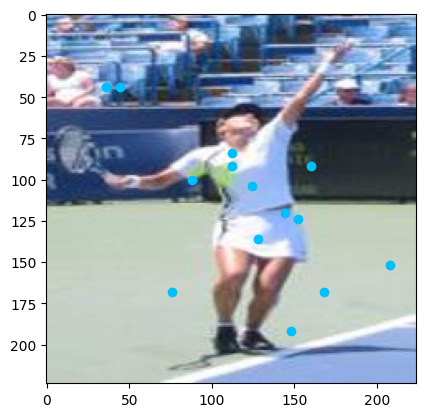

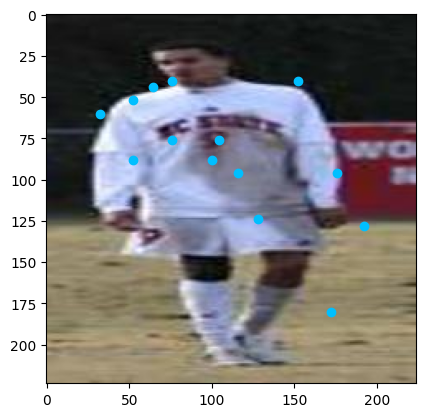

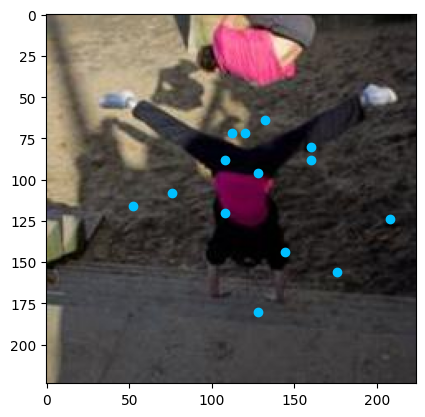

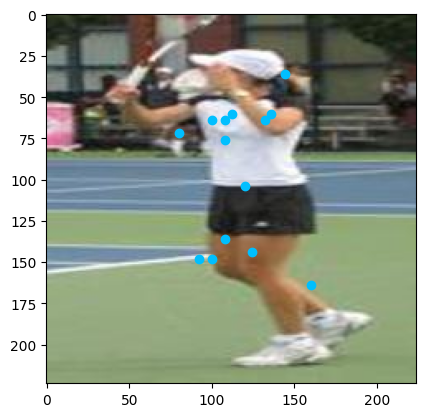

In [25]:
# code to load a pre-trained model

# model = TransformerPoseModel(2)
# model.load_state_dict(torch.load('/Users/richardpignatiello/repos/4701/JointPoseEstimation/trained_models/12_7_300.pth'))
# model.to(device)

model = TransformerPoseModel(2)
model.load_state_dict(torch.load('/kaggle/input/12-10-125/12_10_125.pth', map_location='cpu'))
model.to(device)

best = validate(
  model=model,
  optimizer=optimizer,
  loss_func=loss_func,
  data_loader=val_loader,
  device=device
)
print(best)


plot_many(model, device, data_loader=val_loader, showTrue=True)

#test_plot(model, device, best)